In [1]:
import omicverse as ov
import scanpy as sc

ov.plot_set()

2024-11-13 23:01:46.890750: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-13 23:01:46.912076: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-13 23:01:46.918497: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-13 23:01:47.984143: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT



   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.6.9, Tutorials: https://omicverse.readthedocs.io/
Dependency error: (pydeseq2 0.4.11 (/mnt/home/zehuazeng/software/rsc/lib/python3.10/site-packages), Requirement.parse('pydeseq2<=0.4.0,>=0.3'))


In [15]:
#胃癌和正常组织
adata_gc1=sc.read('data/gc_raw.h5ad')
adata_gc1

AnnData object with n_obs × n_vars = 97660 × 38606
    obs: 'sample_batch', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'hrr_name'
    var: 'gene_ids', 'feature_types', 'genome', 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [16]:
adata_gc1.obs

,sample_batch,initial_size_unspliced,initial_size_spliced,initial_size,hrr_name
HRR207233:AAACCTGAGGGT,TCCC-1,634,2455,2455.0,HRR207233
HRR207233:AAACCTGAGTAG,GTGC-1,1099,634,634.0,HRR207233
HRR207233:AAACCTGAGTGT,ACTC-1,393,1451,1451.0,HRR207233
HRR207233:AAACCTGCATGG,ATGG-1,541,1827,1827.0,HRR207233
HRR207233:AAACCTGGTATA,ATGG-1,786,1753,1753.0,HRR207233
...,...,...,...,...,...
HRR207228:TTTGTCACACGA,AACG-1,649,1747,1747.0,HRR207228
HRR207228:TTTGTCACAGGC,GATA-1,985,2917,2917.0,HRR207228
HRR207228:TTTGTCACATAC,TACG-1,1169,2701,2701.0,HRR207228
HRR207228:TTTGTCAGTTGA,TTCG-1,567,1446,1446.0,HRR207228


In [31]:
import pandas as pd
adata_gc1_meta=pd.read_excel('data/HRA000704.xlsx',sheet_name=3)
adata_gc1_meta.head()

,Accession,Run title,Experiment accession,Run data file type,File name 1,MD5 checksum 1,DownLoad1,File name 2,MD5 checksum 2,DownLoad2,Reference file name,MD5 for reference file,Assembly Name or Accession,Assembly Accession URL
0,HRR207224,Expression-GC01T,HRX168769,fastq,HRR207224_f1.fastq.gz,bf93644cebc47dc7d440f079e22c6ef0,ftp://download.big.ac.cn/gsa-human/HRA000704/H...,HRR207224_r2.fastq.gz,b365128407ac228e2ada2bd652d5aab9,ftp://download.big.ac.cn/gsa-human/HRA000704/H...,NaN,NaN,NaN,NaN
1,HRR207225,Expression-GC02T,HRX168770,fastq,HRR207225_f1.fastq.gz,abd35b183d7455e3bcfd8e31ec218977,ftp://download.big.ac.cn/gsa-human/HRA000704/H...,HRR207225_r2.fastq.gz,2db79da1b9b3d996cfd9ec6822e374c2,ftp://download.big.ac.cn/gsa-human/HRA000704/H...,NaN,NaN,NaN,NaN
2,HRR207226,Expression-GC02T-TIL,HRX168771,fastq,HRR207226_f1.fastq.gz,78bd9f405f37db89302abe2b5a48dd45,ftp://download.big.ac.cn/gsa-human/HRA000704/H...,HRR207226_r2.fastq.gz,c34cf0111d884ddf961b4824ec6303b4,ftp://download.big.ac.cn/gsa-human/HRA000704/H...,NaN,NaN,NaN,NaN
3,HRR207227,Expression-GC03P,HRX168772,fastq,HRR207227_f1.fastq.gz,40026dffbaf6c6623399b7b51ffb29a8,ftp://download.big.ac.cn/gsa-human/HRA000704/H...,HRR207227_r2.fastq.gz,d6296ad8a482e2095b1d116bccfc03ee,ftp://download.big.ac.cn/gsa-human/HRA000704/H...,NaN,NaN,NaN,NaN
4,HRR207228,Expression-GC03T-rep1,HRX168773,fastq,HRR207228_f1.fastq.gz,789462f1c06b64c8696689778bb78e0b,ftp://download.big.ac.cn/gsa-human/HRA000704/H...,HRR207228_r2.fastq.gz,70467409b47d52d740f3e7a869c3f8af,ftp://download.big.ac.cn/gsa-human/HRA000704/H...,NaN,NaN,NaN,NaN


In [24]:
adata_gc1.obs['Experiment']=adata_gc1.obs['hrr_name'].map(
    dict(zip(
        adata_gc1_meta['Accession'].tolist(),
        adata_gc1_meta['Experiment accession'].tolist(),
    ))
)
adata_gc1.obs['title']=adata_gc1.obs['hrr_name'].map(
    dict(zip(
        adata_gc1_meta['Accession'].tolist(),
        adata_gc1_meta['Run title'].tolist(),
    ))
)

In [32]:
import pandas as pd
adata_gc1_meta=pd.read_excel('data/HRA000704.xlsx',sheet_name=2)
adata_gc1_meta.head()

,Accession,Experiment title,BioSample name,BioSample accession,Platform,Library Construction / Experimental Design,Library name,Strategy,Source,Selection,Layout,Read length for mate1(bp),Read length for mate 2(bp),Insert size (bp),Nominal size (bp),Nominal standard deviation (bp),Planned number of cycles
0,HRX168769,Expression-GC01T,GC01-Tumor,HRS147435,Illumina HiSeq X Ten,Gene expression library were prepared followin...,NaN,RNA-Seq,TRANSCRIPTOMIC SINGLE CELL,cDNA,PAIRED,150,150,NaN,NaN,NaN,NaN
1,HRX168770,Expression-GC02T,GC02-Tumor,HRS147436,Illumina HiSeq X Ten,Gene expression library were prepared followin...,NaN,RNA-Seq,TRANSCRIPTOMIC SINGLE CELL,cDNA,PAIRED,150,150,NaN,NaN,NaN,NaN
2,HRX168771,Expression-GC02T-TIL,GC02-TIL,HRS147437,Illumina HiSeq X Ten,Gene expression library were prepared followin...,NaN,RNA-Seq,TRANSCRIPTOMIC SINGLE CELL,cDNA,PAIRED,150,150,NaN,NaN,NaN,NaN
3,HRX168772,Expression-GC03P,GC03-Para,HRS147438,Illumina HiSeq X Ten,Gene expression library were prepared followin...,NaN,RNA-Seq,TRANSCRIPTOMIC SINGLE CELL,cDNA,PAIRED,150,150,NaN,NaN,NaN,NaN
4,HRX168773,Expression-GC03T-rep1,GC03-Tumor,HRS147439,Illumina HiSeq X Ten,Gene expression library were prepared followin...,NaN,RNA-Seq,TRANSCRIPTOMIC SINGLE CELL,cDNA,PAIRED,150,150,NaN,NaN,NaN,NaN


In [35]:
adata_gc1.obs['BioSample']=adata_gc1.obs['Experiment'].map(
    dict(zip(
        adata_gc1_meta['Accession'].tolist(),
        adata_gc1_meta['BioSample name'].tolist(),
    ))
)
adata_gc1.obs['patient']=[i.split('-')[0] for i in adata_gc1.obs['BioSample'].tolist()]

In [36]:
adata_gc1.obs.head()

,sample_batch,initial_size_unspliced,initial_size_spliced,initial_size,hrr_name,Experiment,title,BioSample,patient
HRR207233:AAACCTGAGGGT,TCCC-1,634,2455,2455.0,HRR207233,HRX168778,Expression-GC05T,GC05-Tumor,GC05
HRR207233:AAACCTGAGTAG,GTGC-1,1099,634,634.0,HRR207233,HRX168778,Expression-GC05T,GC05-Tumor,GC05
HRR207233:AAACCTGAGTGT,ACTC-1,393,1451,1451.0,HRR207233,HRX168778,Expression-GC05T,GC05-Tumor,GC05
HRR207233:AAACCTGCATGG,ATGG-1,541,1827,1827.0,HRR207233,HRX168778,Expression-GC05T,GC05-Tumor,GC05
HRR207233:AAACCTGGTATA,ATGG-1,786,1753,1753.0,HRR207233,HRX168778,Expression-GC05T,GC05-Tumor,GC05


In [29]:
adata_gc1_meta2=pd.read_excel('data/41467_2022_32627_MOESM4_ESM.xlsx',sheet_name=1)
adata_gc1_meta2.head()

,Patient ID,Age,Gender,Helicobacter pylori,Lauren's Classification,TNM Classification,Staging,Locaton,Tumor size (cm),pathologic diagnoses
0,GC01,66,Female,Unkown,Mixed,T2N3aM0,IIIA,"Antrum, Pylorus",4x3x1.5,Adenocarcinoma with partial signet ring cell c...
1,GC02,61,Male,Negative,Mixed,T2N1M0,IIA,Antrum,4x3x0.5,Adenocarcinoma
2,GC03,73,Female,Negative,Diffuse,T4aN1M0,IIIA,Lower body,3x2.5x1,Adenocarcinoma
3,GC04,51,Male,Postive,Mixed,T3N3aM0,IIIB,Lower body,5.5x4x1,Adenocarcinoma
4,GC05,59,Female,Negative,Mixed,T1bN2M0,IIA,Antrum,4x3.8x0.3,Adenocarcinoma


In [42]:
adata_gc1.obs['CancerType']=adata_gc1.obs['patient'].map(
    dict(zip(
        adata_gc1_meta2['Patient ID'].tolist(),
        adata_gc1_meta2["Lauren's Classification"].tolist(),
    ))
)
adata_gc1.obs['Stage']=adata_gc1.obs['patient'].map(
    dict(zip(
        adata_gc1_meta2['Patient ID'].tolist(),
        adata_gc1_meta2["TNM Classification"].tolist(),
    ))
)

In [49]:
adata_gc1.obs['CancerStage']=[i[:2] for i in adata_gc1.obs['Stage'].tolist()]

In [53]:
adata_gc1.obs['CancerType'].unique()

['Mixed', 'Diffuse', 'Intestinal']
Categories (3, object): ['Diffuse', 'Intestinal', 'Mixed']

In [40]:
adata_gc1.obs.index=[i+j for i,j in zip(
    adata_gc1.obs.index.tolist(),
    adata_gc1.obs['sample_batch'].tolist()
)]

In [51]:
adata_gc1.obs['CancerStage'].unique()

array(['T1', 'T4', 'T3', 'T2'], dtype=object)

In [57]:
adata_gc1.obs.head()

,sample_batch,initial_size_unspliced,initial_size_spliced,initial_size,hrr_name,Experiment,title,BioSample,patient,CancerType,Stage,CancerStage
HRR207233:AAACCTGAGGGTTCCC-1,TCCC-1,634,2455,2455.0,HRR207233,HRX168778,Expression-GC05T,GC05-Tumor,GC05,Mixed,T1bN2M0,T1
HRR207233:AAACCTGAGTAGGTGC-1,GTGC-1,1099,634,634.0,HRR207233,HRX168778,Expression-GC05T,GC05-Tumor,GC05,Mixed,T1bN2M0,T1
HRR207233:AAACCTGAGTGTACTC-1,ACTC-1,393,1451,1451.0,HRR207233,HRX168778,Expression-GC05T,GC05-Tumor,GC05,Mixed,T1bN2M0,T1
HRR207233:AAACCTGCATGGATGG-1,ATGG-1,541,1827,1827.0,HRR207233,HRX168778,Expression-GC05T,GC05-Tumor,GC05,Mixed,T1bN2M0,T1
HRR207233:AAACCTGGTATAATGG-1,ATGG-1,786,1753,1753.0,HRR207233,HRX168778,Expression-GC05T,GC05-Tumor,GC05,Mixed,T1bN2M0,T1


In [52]:
adata_gc1.write('data/gc_raw.h5ad',compression='gzip')

In [ ]:
#https://explore.data.humancellatlas.org/projects/cfece4d2-f18d-44ad-a46a-42bbcb5cb3b7/project-metadata

In [10]:
#全是胃癌患者，存放在patient
adata_gc2=sc.read('data/GC_norm.h5ad')
adata_gc2

AnnData object with n_obs × n_vars = 91270 × 33538
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'contami_frac', 'percent.mt', 'ident', 'RNA_snn_res.0.5', 'seurat_clusters', 'patient', 'replicate', 'subtype', 'celltype_singleR', 'cxds_score', 'bcds_score', 'hybrid_score', 'RNA_snn_res.0.8', 'major_clusters', 'subcluster', 'subcluster.v2'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    obsm: 'X_harmony', 'X_pca', 'X_tsne', 'X_umap'

In [ ]:
#diffuse-type gastric cancer (DGC)
#intestinal-type gastric cancer (IGC)
#alpha-fetoprotein (AFP)-producing gastric carcinoma (AFP)
#mixed histology according to the Lauren classification (MSI)

In [13]:
adata_gc2.obs['subtype'].unique()

['IGC', 'MSI', 'DGC', 'AFP', 'Unknown(Normal)']
Categories (5, object): ['AFP', 'DGC', 'IGC', 'MSI', 'Unknown(Normal)']

In [54]:
adata_gc2.obs['CancerType']=adata_gc2.obs['subtype'].map(
    {
        'MSI':'Mixed',
        'IGC':'Intestinal',
        'DGC':'Diffuse',
        'AFP':'Mixed',
        'Unknown(Normal)':'Normal',
    }
)

In [55]:
adata_gc2.obs['CancerStage']='Unknown'

In [56]:
adata_gc2.write('data/GC_norm.h5ad',compression='gzip')

In [2]:
import os
gsm_files=[i for i in os.listdir('data') if 'GSM' in i]

In [3]:
import pandas as pd
for idx,gsm_file in enumerate(gsm_files):
    print(gsm_file)
    data1=pd.read_csv(f'data/{gsm_file}',sep='\t')
    adata_t1=sc.AnnData(data1.T)
    adata_t1.obs['sample']=gsm_file.split('_')[0]
    patient=gsm_file.split('_')[2].split('.')[0]
    adata_t1.obs['patient']=patient
    adata_t1.obs.index=[f"{patient}:{i}" for i in adata_t1.obs.index]
    if idx==0:
        adata_gc3=adata_t1
    else:
        adata_gc3=sc.concat([adata_gc3,adata_t1])
    del adata_t1
    import gc
    gc.collect()

GSM3954958_processed_EGC.txt.gz
GSM3954953_processed_IMW2.txt.gz
GSM3954956_processed_IMS3.txt.gz
GSM3954955_processed_IMS2.txt.gz
GSM3954949_processed_CAG1.txt.gz
GSM3954951_processed_CAG3.txt.gz
GSM3954947_processed_NAG2.txt.gz
GSM3954946_processed_NAG1.txt.gz
GSM3954952_processed_IMW1.txt.gz
GSM3954954_processed_IMS1.txt.gz
GSM3954948_processed_NAG3.txt.gz
GSM3954957_processed_IMS4.txt.gz
GSM3954950_processed_CAG2.txt.gz


In [5]:
adata_gc3.write('data/adata_gc3.h5ad',compression='gzip')

In [46]:
adata_gc3.obs['Type']=[i[:3] for i in adata_gc3.obs['patient'].tolist()]

In [48]:
adata_gc3.obs['CancerType']=adata_gc3.obs['Type'].map(
    {
        'EGC':'Mixed',
        'IMW':'Gastritis',
        'CAG':'Gastritis',
        'IMS':'Gastritis',
        'NAG':'Gastritis',
    }
)
adata_gc3.obs['CancerStage']=adata_gc3.obs['Type'].map(
    {
        'EGC':'T1',
        'IMW':'No',
        'CAG':'No',
        'IMS':'No',
        'NAG':'No',
    }
)

In [ ]:
当然可以，以下是图像中的文字：

- GSM3954946 Non-atrophic gastritis 1
- GSM3954947 Non-atrophic gastritis 2
- GSM3954948 Non-atrophic gastritis 3
- GSM3954949 Chronic atrophic gastritis 1
- GSM3954950 Chronic atrophic gastritis 2
- GSM3954951 Chronic atrophic gastritis 3
- GSM3954952 Wild Intestinal metaplasia 1
- GSM3954953 Wild Intestinal metaplasia 2
- GSM3954954 Severe Intestinal metaplasia 1
- GSM3954955 Severe Intestinal metaplasia 2
- GSM3954956 Severe Intestinal metaplasia 3
- GSM3954957 Severe Intestinal metaplasia 4
- GSM3954958 Early gastric cancer

In [59]:
adata=sc.concat([
    adata_gc1,adata_gc2,adata_gc3
],merge='same')
adata

AnnData object with n_obs × n_vars = 245370 × 16376
    obs: 'patient', 'CancerType', 'CancerStage'

In [62]:
adata.obs['CancerType'].unique()

array(['Mixed', 'Diffuse', 'Intestinal', 'Normal', 'Gastritis'],
      dtype=object)

In [65]:
adata.write('data/GC_All_RAW.h5ad',compression='gzip')

In [2]:
adata=ov.read('data/GC_All_RAW.h5ad',compression='gzip')

In [3]:
adata.var_names_make_unique()
adata.obs_names_make_unique()

In [4]:
%%time
adata=ov.pp.qc(adata,
              tresh={'mito_perc': 0.2, 'nUMIs': 500, 'detected_genes': 250},
               doublets_method='scrublet',
              batch_key='patient')
adata

CPU mode activated
Calculate QC metrics
End calculation of QC metrics.
Original cell number: 245370
!!!It should be noted that the `scrublet` detection is too old and             may not work properly.!!!
!!!if you want to use novel doublet detection,             please set `doublets_method=sccomposite`!!!
Begin of post doublets removal and QC plot using`scrublet`
Running Scrublet
filtered out 2807 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
Embedding transcriptomes using PCA...
    using data matrix X directly
Automatically set threshold at doublet score = 0.52
Detected doublet rate = 0.0%
E

AnnData object with n_obs × n_vars = 150222 × 16371
    obs: 'patient', 'CancerType', 'CancerStage', 'nUMIs', 'mito_perc', 'detected_genes', 'cell_complexity', 'n_genes', 'doublet_score', 'predicted_doublet', 'passing_mt', 'passing_nUMIs', 'passing_ngenes'
    var: 'mt', 'n_cells'
    uns: 'scrublet'

In [5]:
%%time
adata=ov.pp.preprocess(adata,mode='shiftlog|pearson',n_HVGs=3000,
                      batch_key='patient')
adata

Begin robust gene identification
After filtration, 16371/16371 genes are kept.     Among 16371 genes, 15496 genes are robust.
End of robust gene identification.
Begin size normalization: shiftlog and HVGs selection pearson
normalizing counts per cell. The following highly-expressed genes are not considered during normalization factor computation:
['GKN1', 'REG1A', 'REG3A', 'GCG', 'PTMA', 'GHRL', 'CCK', 'SST', 'CXCL14', 'HLA-B', 'MLN', 'PGC', 'DEFA6', 'DEFA5', 'SPINK4', 'CCL21', 'LIPF', 'HBB', 'PGA3', 'PGA5', 'FTH1', 'MALAT1', 'APOA1', 'LYZ', 'NTS', 'CHGA', 'CRIP1', 'B2M', 'HBA2', 'HBA1', 'MT2A', 'MT1G', 'CCL4', 'GAST', 'GIP', 'TTR', 'FTL', 'TFF2', 'TFF1', 'IGLL5', 'TMSB4X']
    finished (0:00:01)
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'highly_variable_nbatches', int vector (adata.var)
    'highly_variable_intersection', boolean vector (adata.var)
    'means', float vector (ada

AnnData object with n_obs × n_vars = 150222 × 15496
    obs: 'patient', 'CancerType', 'CancerStage', 'nUMIs', 'mito_perc', 'detected_genes', 'cell_complexity', 'n_genes', 'doublet_score', 'predicted_doublet', 'passing_mt', 'passing_nUMIs', 'passing_ngenes'
    var: 'mt', 'n_cells', 'percent_cells', 'robust', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable_nbatches', 'highly_variable_intersection', 'highly_variable_features'
    uns: 'scrublet', 'log1p', 'hvg'
    layers: 'counts'

In [6]:
adata.write('data/GC_All_QC.h5ad',compression='gzip')

In [3]:
adata=sc.read('data/GC_All_QC.h5ad')
adata

AnnData object with n_obs × n_vars = 150222 × 15496
    obs: 'patient', 'CancerType', 'CancerStage', 'nUMIs', 'mito_perc', 'detected_genes', 'cell_complexity', 'n_genes', 'doublet_score', 'predicted_doublet', 'passing_mt', 'passing_nUMIs', 'passing_ngenes'
    var: 'mt', 'n_cells', 'percent_cells', 'robust', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable_nbatches', 'highly_variable_intersection', 'highly_variable_features'
    uns: 'hvg', 'log1p', 'scrublet'
    layers: 'counts'

In [4]:
%%time
ov.pp.scale(adata)
adata

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
CPU times: user 19.2 s, sys: 20.1 s, total: 39.3 s
Wall time: 32.9 s


AnnData object with n_obs × n_vars = 150222 × 15496
    obs: 'patient', 'CancerType', 'CancerStage', 'nUMIs', 'mito_perc', 'detected_genes', 'cell_complexity', 'n_genes', 'doublet_score', 'predicted_doublet', 'passing_mt', 'passing_nUMIs', 'passing_ngenes'
    var: 'mt', 'n_cells', 'percent_cells', 'robust', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable_nbatches', 'highly_variable_intersection', 'highly_variable_features'
    uns: 'hvg', 'log1p', 'scrublet'
    layers: 'counts', 'scaled'

In [6]:
%%time
ov.pp.pca(adata,layer='scaled',n_pcs=50,
          mask_var='highly_variable_features')
adata

computing PCA
    with n_comps=50
    finished (0:00:58)
CPU times: user 7min 49s, sys: 1min 8s, total: 8min 58s
Wall time: 58.1 s


AnnData object with n_obs × n_vars = 150222 × 15496
    obs: 'patient', 'CancerType', 'CancerStage', 'nUMIs', 'mito_perc', 'detected_genes', 'cell_complexity', 'n_genes', 'doublet_score', 'predicted_doublet', 'passing_mt', 'passing_nUMIs', 'passing_ngenes'
    var: 'mt', 'n_cells', 'percent_cells', 'robust', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable_nbatches', 'highly_variable_intersection', 'highly_variable_features'
    uns: 'hvg', 'log1p', 'scrublet', 'pca', 'scaled|original|pca_var_ratios', 'scaled|original|cum_sum_eigenvalues'
    obsm: 'X_pca', 'scaled|original|X_pca'
    varm: 'PCs', 'scaled|original|pca_loadings'
    layers: 'counts', 'scaled', 'lognorm'

In [7]:
ov.pp.mde(adata,embedding_dim=2,
          n_neighbors=15, basis='X_mde_pca',
          n_pcs=50, use_rep='scaled|original|X_pca',)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsm['X_mde_pca']`, MDE coordinates
    `.obsp['neighbors_distances']`, distances for each pair of neighbors
    `.obsp['neighbors_connectivities']`, weighted adjacency matrix (0:00:35)


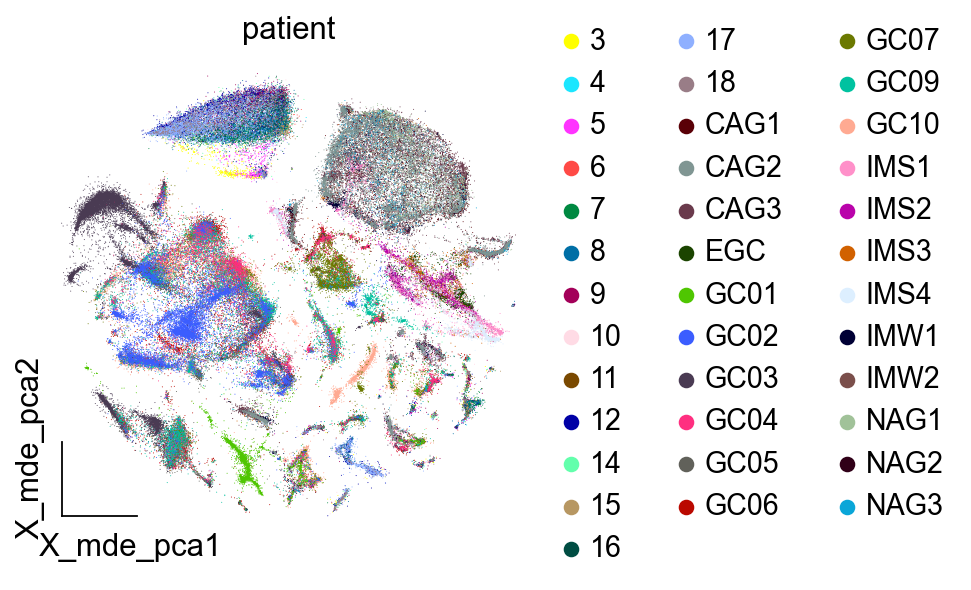

In [8]:
ov.pl.embedding(adata,
                basis='X_mde_pca',
                color='patient',
                frameon='small')

In [10]:
del adata.layers['lognorm']

In [11]:
adata.write('data/GC_All_PCA.h5ad',compression='gzip')

In [1]:
import omicverse as ov
import scanpy as sc

ov.plot_set()

2024-11-13 21:16:18.742807: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-13 21:16:18.776446: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-13 21:16:18.788758: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-13 21:16:22.592728: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT



   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.6.9, Tutorials: https://omicverse.readthedocs.io/
Dependency error: (pydeseq2 0.4.11 (/mnt/home/zehuazeng/software/rsc/lib/python3.10/site-packages), Requirement.parse('pydeseq2<=0.4.0,>=0.3'))


In [2]:
adata=ov.read('data/GC_All_PCA.h5ad',compression='gzip')
adata.raw = adata
adata = adata[:, adata.var.highly_variable_features]
adata

View of AnnData object with n_obs × n_vars = 150222 × 3000
    obs: 'patient', 'CancerType', 'CancerStage', 'nUMIs', 'mito_perc', 'detected_genes', 'cell_complexity', 'n_genes', 'doublet_score', 'predicted_doublet', 'passing_mt', 'passing_nUMIs', 'passing_ngenes'
    var: 'mt', 'n_cells', 'percent_cells', 'robust', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable_nbatches', 'highly_variable_intersection', 'highly_variable_features'
    uns: 'hvg', 'log1p', 'neighbors', 'patient_colors', 'pca', 'scaled|original|cum_sum_eigenvalues', 'scaled|original|pca_var_ratios', 'scrublet'
    obsm: 'X_mde_pca', 'X_pca', 'scaled|original|X_pca'
    varm: 'PCs', 'scaled|original|pca_loadings'
    layers: 'counts', 'scaled'
    obsp: 'connectivities', 'distances'

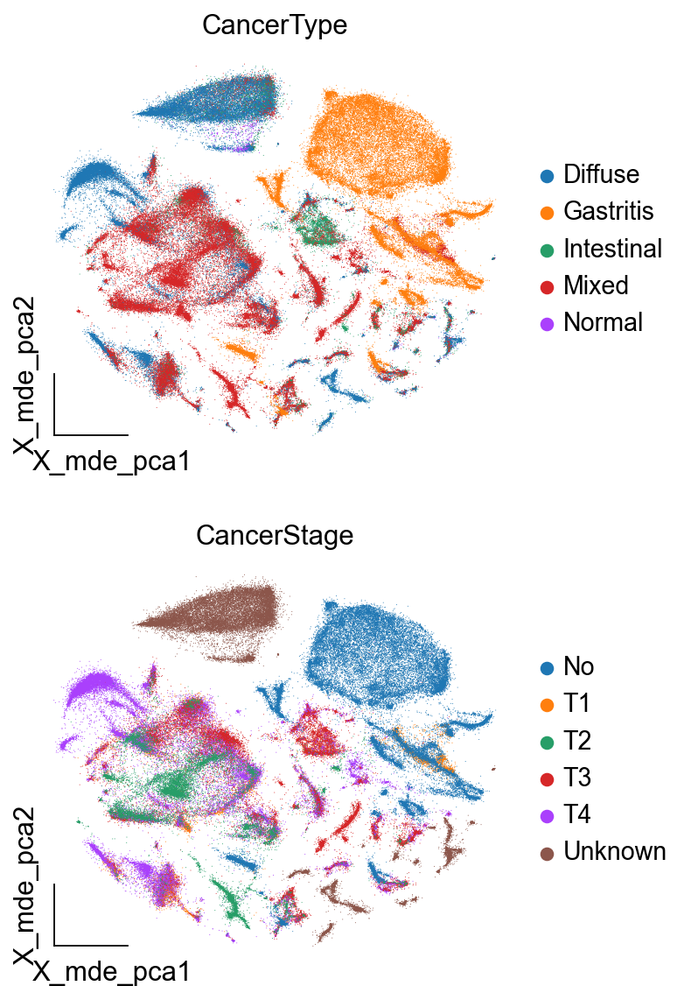

In [3]:
ov.pl.embedding(adata,
                basis='X_mde_pca',
                color=['CancerType','CancerStage'],
                ncols=1,
                frameon='small')

In [4]:
import scvi
scvi.model.SCVI.setup_anndata(adata, layer="counts", batch_key="patient",
                             #categorical_covariate_keys=['CancerType']
                             )

In [5]:
model = scvi.model.SCVI(adata, n_layers=2, n_latent=50, gene_likelihood="nb")
model.train()

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 53/53: 100%|██████████| 53/53 [06:03<00:00,  7.16s/it, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.43e+3]

`Trainer.fit` stopped: `max_epochs=53` reached.


Epoch 53/53: 100%|██████████| 53/53 [06:03<00:00,  6.86s/it, v_num=1, train_loss_step=1.28e+3, train_loss_epoch=1.43e+3]


In [6]:
SCVI_LATENT_KEY = "X_scVI"
adata.obsm[SCVI_LATENT_KEY] = model.get_latent_representation()

In [7]:
ov.pp.mde(adata,embedding_dim=2,
          n_neighbors=15, basis='X_mde_scVI',
          n_pcs=50, use_rep='X_scVI',)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsm['X_mde_scVI']`, MDE coordinates
    `.obsp['neighbors_distances']`, distances for each pair of neighbors
    `.obsp['neighbors_connectivities']`, weighted adjacency matrix (0:00:39)


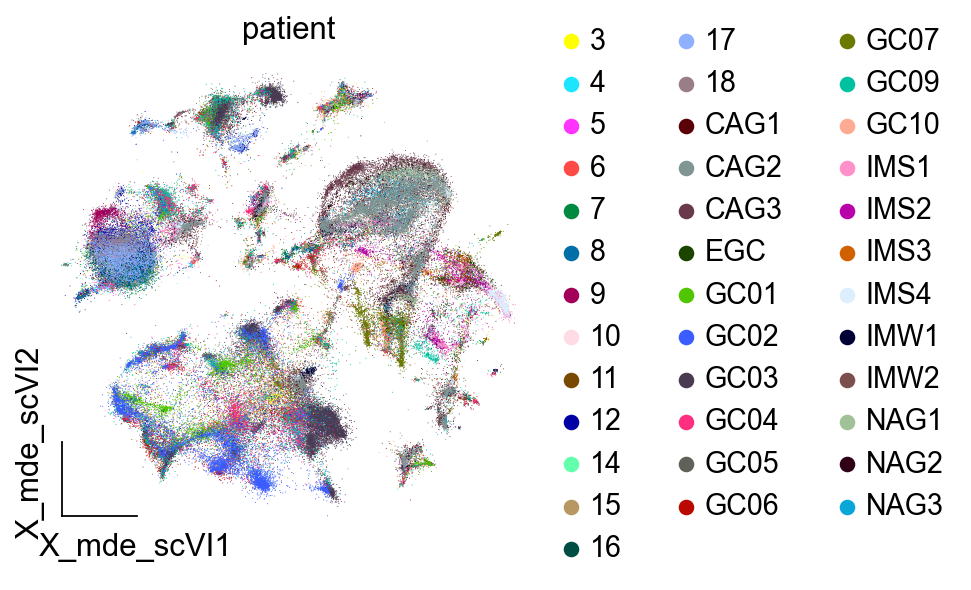

In [8]:
ov.pl.embedding(adata,
                basis='X_mde_scVI',
                color='patient',
                frameon='small')

In [9]:
ov.pp.leiden(adata)

running Leiden clustering
    finished: found 40 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:36)


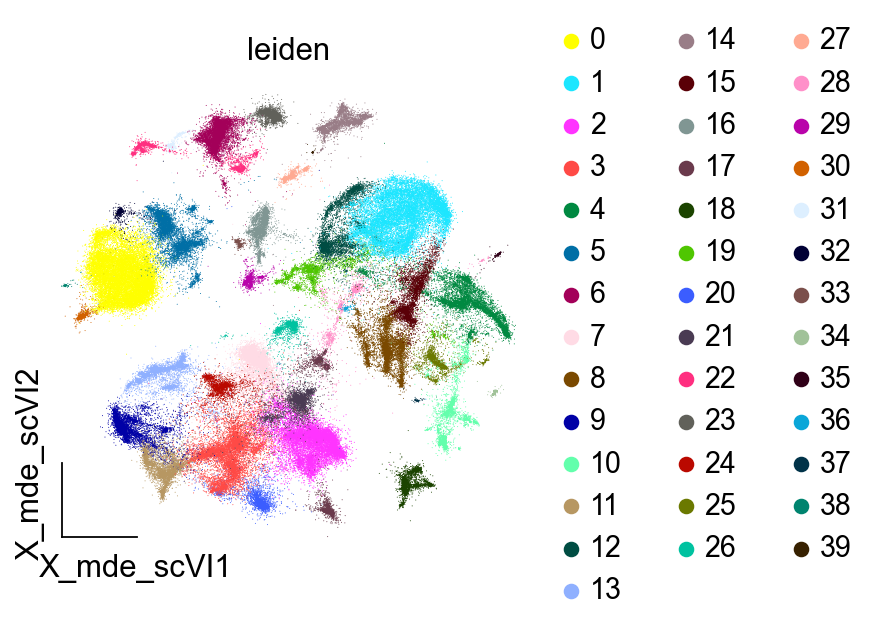

In [10]:
ov.pl.embedding(adata,
                basis='X_mde_scVI',
                color='leiden',
                frameon='small')

Storing dendrogram info using `.uns['dendrogram_leiden']`
ranking genes
    finished: added to `.uns['leiden_ttest']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:10)


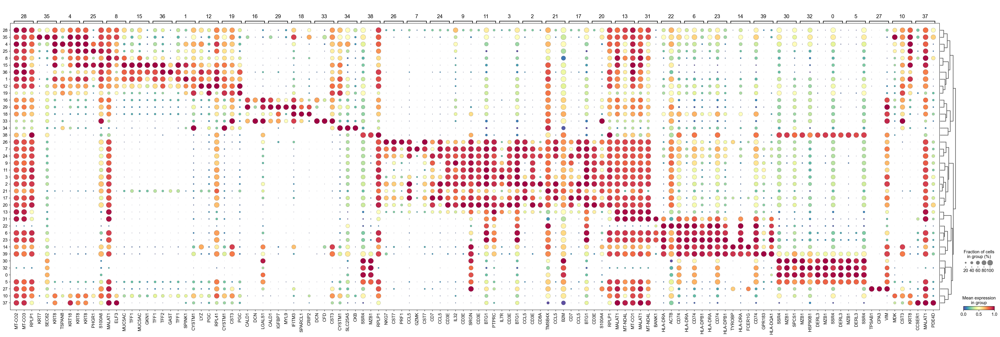

In [11]:
sc.tl.dendrogram(adata,'leiden',use_rep='X_scVI')
sc.tl.rank_genes_groups(adata, 'leiden', use_rep='X_scVI',
                        method='t-test',use_raw=False,key_added='leiden_ttest')
sc.pl.rank_genes_groups_dotplot(adata,groupby='leiden',
                                cmap='Spectral_r',key='leiden_ttest',
                                standard_scale='var',n_genes=3)

In [12]:
all_markers=ov.single.get_celltype_marker(adata,clustertype='leiden',rank=True,
                                          key='leiden_ttest',
                                          foldchange=2,topgenenumber=10)
#all_markers

...get cell type marker


In [14]:
import gptbioinsightor as gbi 

### 设置大语言模型的API KEY
import os
os.environ['API_KEY'] = "sk-f03e62ed77fc4ce38682e3b6a887064c"

# 设置数据的背景信息
background = f"Cells from stomach human" 

# 确保adata已经进行了差异基因分析，例如: sc.tl.rank_genes_groups(adata, "leiden", method="wilcoxon")
# 我们使用Aliyun 的 qwen2-72b-instruct 进行演示, 但你也可以使用 openai gpt-4o
res = gbi.get_celltype(all_markers, background=background, 
                    out="result/celltype_info.md", 
                    topnumber=15,provider="aliyun", model="qwen-max")
adata.obs['celltype_gbi']=adata.obs['leiden'].map(res)


In [15]:
import os
os.environ['AGI_API_KEY'] = 'sk-FF3MmMGS836Ca29A00A6T3BLBKFJ3BC8ebf196c444659442'  # Replace with your actual API key
result = ov.single.gptcelltype(all_markers, tissuename='stomach', speciename='human',
                      model='gpt-4o', base_url="https://aigptx.top/v1",
                      topgenenumber=10)
result

Note: AGI API key found: returning the cell type annotations.
Note: It is always recommended to check the results returned by GPT-4 in case of AI hallucination, before going to downstream analysis.


{'0': 'Plasma Cells  ',
 '1': 'Mucous Cells  ',
 '10': 'Enteroendocrine Cells  ',
 '11': 'T Cells  ',
 '12': 'Chief Cells  ',
 '13': 'T Cells  ',
 '14': 'Dendritic Cells  ',
 '15': 'Surface Mucous Cells  ',
 '16': 'Fibroblasts  ',
 '17': 'T Cells  ',
 '18': 'Endothelial Cells  ',
 '19': 'Chief Cells  ',
 '2': 'T Cells  ',
 '20': 'T Cells  ',
 '21': 'T Cells  ',
 '22': 'B Cells  ',
 '23': 'B Cells  ',
 '24': 'T Cells  ',
 '25': 'Absorptive Enterocytes  ',
 '26': 'Cytotoxic T Cells',
 '27': 'Mast Cell  ',
 '28': 'Epithelial Cell  ',
 '29': 'Smooth Muscle Cell  ',
 '3': 'T Cell  ',
 '30': 'Plasma Cell  ',
 '31': 'B Cell  ',
 '32': 'Endoplasmic Reticulum Stress-Related Cell  ',
 '33': 'Fibroblast  ',
 '34': 'Parietal Cell  ',
 '35': 'Epithelial Cell  ',
 '36': 'Gastric Chief Cell  ',
 '37': 'Gastric Cell Mixture  ',
 '38': 'Ribosomal Protein-Expressing Cell  ',
 '39': 'Dendritic Cell  ',
 '4': 'Epithelial Cell  ',
 '5': 'B Cell  ',
 '6': 'B Cell with Antigen-Presenting Features  ',
 '7': '

<AxesSubplot: title={'center': 'celltype_gpt'}, xlabel='X_mde_scVI1', ylabel='X_mde_scVI2'>

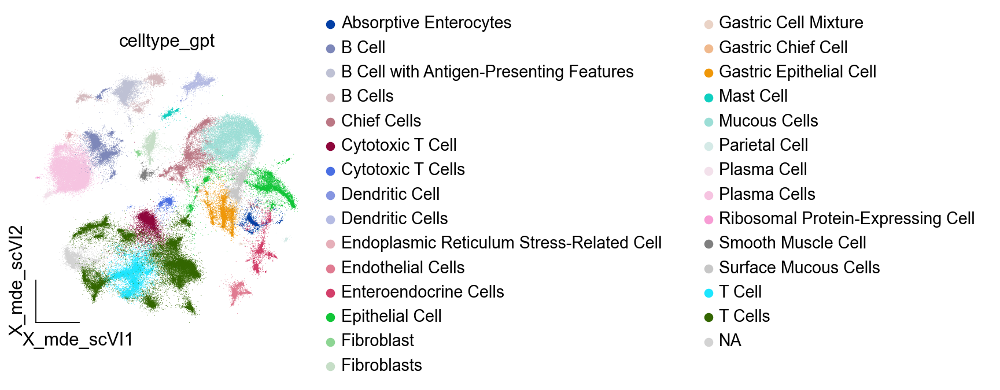

In [16]:
cluster2annotation=result

adata.obs['celltype_gpt'] = adata.obs['leiden'].map(cluster2annotation).astype('category')
ov.utils.embedding(adata,
                basis='X_mde_scVI',frameon='small',
                color=['celltype_gpt'],
                #palette=ov.utils.blue_color+ov.utils.orange_color+ov.utils.red_color+ov.utils.green_color,
                show=False)

In [19]:
adata.uns['marker_dict']=all_markers
adata.obs['best_clusters']=adata.obs['leiden']

In [28]:
def celltype_anno_gpt4celltype(adata,model='gpt-4o',base_url="https://aigptx.top/v1",gpt_num=5):
    result_gpt_dict={}
    from tqdm import tqdm
    for t in tqdm(range(gpt_num)):
        result_gpt = ov.single.gptcelltype(adata.uns['marker_dict'],
                                       tissuename='stomach', speciename='human',
                              model=model,base_url=base_url,
                              topgenenumber=10)
        result_gpt_dict[t]=result_gpt
        adata.obs[f'gpt_celltype_{t}'] = adata.obs['best_clusters'].map(result_gpt).astype('category')
celltype_anno_gpt4celltype(adata)

  0%|          | 0/5 [00:00<?, ?it/s]

Note: AGI API key found: returning the cell type annotations.


 20%|██        | 1/5 [00:10<00:41, 10.45s/it]

Note: It is always recommended to check the results returned by GPT-4 in case of AI hallucination, before going to downstream analysis.
Note: AGI API key found: returning the cell type annotations.


 40%|████      | 2/5 [00:15<00:22,  7.48s/it]

Note: It is always recommended to check the results returned by GPT-4 in case of AI hallucination, before going to downstream analysis.
Note: AGI API key found: returning the cell type annotations.


 60%|██████    | 3/5 [00:21<00:12,  6.47s/it]

Note: It is always recommended to check the results returned by GPT-4 in case of AI hallucination, before going to downstream analysis.
Note: AGI API key found: returning the cell type annotations.


 80%|████████  | 4/5 [00:30<00:07,  7.71s/it]

Note: It is always recommended to check the results returned by GPT-4 in case of AI hallucination, before going to downstream analysis.
Note: AGI API key found: returning the cell type annotations.


100%|██████████| 5/5 [00:36<00:00,  7.22s/it]

Note: It is always recommended to check the results returned by GPT-4 in case of AI hallucination, before going to downstream analysis.


<AxesSubplot: title={'center': 'celltype_gbi'}, xlabel='X_mde_scVI1', ylabel='X_mde_scVI2'>

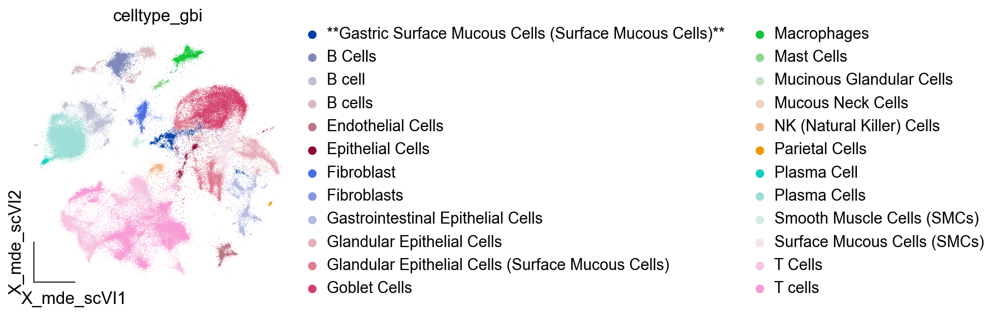

In [17]:
ov.utils.embedding(adata,
                basis='X_mde_scVI',frameon='small',
                color=['celltype_gbi'],
                #palette=ov.utils.blue_color+ov.utils.orange_color+ov.utils.red_color+ov.utils.green_color,
                show=False)

In [69]:
adata.uns['bench_best_res']='X_scVI'

In [71]:
adata.obsm['X_mde']=adata.obsm['X_mde_scVI']

In [1]:
import omicverse as ov
import scanpy as sc
ov.plot_set()

2024-11-13 23:15:19.407688: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-13 23:15:19.429098: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-13 23:15:19.435517: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-13 23:15:22.237905: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT



   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.6.9, Tutorials: https://omicverse.readthedocs.io/
Dependency error: (pydeseq2 0.4.11 (/mnt/home/zehuazeng/software/rsc/lib/python3.10/site-packages), Requirement.parse('pydeseq2<=0.4.0,>=0.3'))


In [2]:
adata_counts=ov.read('data/GC_All_PCA.h5ad',compression='gzip')
adata_counts

AnnData object with n_obs × n_vars = 150222 × 15496
    obs: 'patient', 'CancerType', 'CancerStage', 'nUMIs', 'mito_perc', 'detected_genes', 'cell_complexity', 'n_genes', 'doublet_score', 'predicted_doublet', 'passing_mt', 'passing_nUMIs', 'passing_ngenes'
    var: 'mt', 'n_cells', 'percent_cells', 'robust', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable_nbatches', 'highly_variable_intersection', 'highly_variable_features'
    uns: 'hvg', 'log1p', 'neighbors', 'patient_colors', 'pca', 'scaled|original|cum_sum_eigenvalues', 'scaled|original|pca_var_ratios', 'scrublet'
    obsm: 'X_mde_pca', 'X_pca', 'scaled|original|X_pca'
    varm: 'PCs', 'scaled|original|pca_loadings'
    layers: 'counts', 'scaled'
    obsp: 'connectivities', 'distances'

In [4]:
adata_counts

AnnData object with n_obs × n_vars = 150222 × 15496
    obs: 'patient', 'CancerType', 'CancerStage', 'nUMIs', 'mito_perc', 'detected_genes', 'cell_complexity', 'n_genes', 'doublet_score', 'predicted_doublet', 'passing_mt', 'passing_nUMIs', 'passing_ngenes'
    var: 'mt', 'n_cells', 'percent_cells', 'robust', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable_nbatches', 'highly_variable_intersection', 'highly_variable_features'
    uns: 'hvg', 'log1p', 'neighbors', 'patient_colors', 'pca', 'scaled|original|cum_sum_eigenvalues', 'scaled|original|pca_var_ratios', 'scrublet'
    obsm: 'X_mde_pca', 'X_pca', 'scaled|original|X_pca'
    varm: 'PCs', 'scaled|original|pca_loadings'
    layers: 'counts', 'scaled'
    obsp: 'connectivities', 'distances'

In [6]:
adata_counts.obs=adata.obs
adata_counts.obsm=adata.obsm
adata_counts.obsp=adata.obsp

<AxesSubplot: title={'center': 'celltype_gbi'}, xlabel='X_mde_scVI1', ylabel='X_mde_scVI2'>

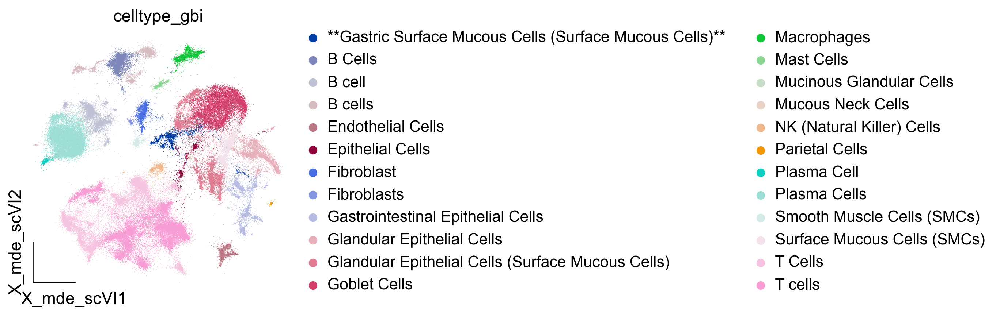

In [7]:
ov.utils.embedding(adata_counts,
                basis='X_mde_scVI',frameon='small',
                color=['celltype_gbi'],
                #palette=ov.utils.blue_color+ov.utils.orange_color+ov.utils.red_color+ov.utils.green_color,
                show=False)

In [8]:
adata_counts.write('data/GC_All_SCVI.h5ad',compression='gzip')

In [2]:
import scanpy as sc
import omicverse as ov

2024-11-13 23:18:46.027752: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-13 23:18:46.342424: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-13 23:18:46.427922: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-13 23:18:51.061552: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT



   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.6.9, Tutorials: https://omicverse.readthedocs.io/


In [3]:
adata=ov.read('data/GC_All_SCVI.h5ad')

In [4]:
adata.uns['bench_best_res']='X_scVI'

In [ ]:
def celltype_anno_scmulan(adata,ckp_path,output_dir,tissue):
    #adata=adata1.copy()
    adata.X=adata.layers['counts'].copy()
    adata_GS_uniformed = ov.externel.scMulan.GeneSymbolUniform(input_adata=adata,
                             output_dir=output_dir,
                             output_prefix=tissue)
    del adata
    import gc
    gc.collect()
    # norm and log1p count matrix
    if adata_GS_uniformed.X.max() > 10:
        sc.pp.normalize_total(adata_GS_uniformed, target_sum=1e4) 
        sc.pp.log1p(adata_GS_uniformed)
    scml = ov.externel.scMulan.model_inference(ckp_path, adata_GS_uniformed)
    base_process = scml.cuda_count()
    #self.scml=scml
    scml.get_cell_types_and_embds_for_adata(parallel=True, n_process = base_process)
    scml.adata.obsm[adata.uns['bench_best_res']]=adata.obsm[adata.uns['bench_best_res']]
    scml.adata.obsm['X_mde']=adata.obsm['X_mde']
    adata.obs['cell_type_from_scMulan']=adata.obs['cell_type_from_scMulan']
    adata.obsm['X_scMulan']=adata.obsm['X_scMulan']
    ov.externel.scMulan.cell_type_smoothing(adata, use_rep=adata.uns['bench_best_res'],
                                            n_pcs=10,threshold=0.1)     
    
    #self.adata.obs['cell_type_from_mulan_smoothing']=self.adata.obs['cell_type_from_mulan_smoothing']
    adata.obs['cell_type_from_mulan_smooth_ov']=ov.utils.refine_label(adata, use_rep='X_mde',
                                                                           radius=30, key='cell_type_from_scMulan')

    del scml
    import gc
    gc.collect()

celltype_anno_scmulan(adata,ckp_path='/mnt/home/zehuazeng/analysis/scMulan/ckpt/ckpt_scMulan.pt',
                      output_dir='result',
                     tissue='stomatch')

{message}
The shape of query data is: (150222, 15496)
The length of reference gene_list is: 42117
Performing gene symbol uniform, this step may take several minutes


Processing: 100%|██████████| 15496/15496 [00:11<00:00, 1354.01it/s]


Building output data, this step may take several minutes


Processing: 100%|██████████| 15496/15496 [00:38<00:00, 403.18it/s]

In [25]:
gpt_num=5

In [29]:
cluster_celltypes={}
adata.obs['best_clusters']=adata.obs['best_clusters'].astype('category')
for ct in adata.obs['best_clusters'].cat.categories:
    ct1=adata.obs.loc[adata.obs['best_clusters']==ct,'celltype_gbi'].value_counts().index[0]
    ct_li=[]
    for num in range(gpt_num):
        ct_li.append(adata.obs.loc[adata.obs['best_clusters']==ct,f'gpt_celltype_{num}'].value_counts().index[0])

    cluster_celltypes[ct]=ct1=ct_li

cluster_markers = adata.uns['marker_dict']

# 调用函数并打印结果
result = get_cluster_celltype(cluster_celltypes, cluster_markers, 
                              species='human', organization='stomach',
                             model='gpt-4o',base_url="https://aigptx.top/v1")
adata.obs['best_celltype'] = adata.obs['best_clusters'].map(result).astype('category')

100%|██████████| 40/40 [00:33<00:00,  1.21it/s]


In [30]:

def get_cluster_celltype(cluster_celltypes, cluster_markers, species, organization,
                        model,base_url):
    from openai import OpenAI
    import os
    import numpy as np
    import pandas as pd
    if base_url is None:
        if provider == 'openai':
            base_url = "https://api.openai.com/v1/"
        elif provider == 'kimi':
            base_url = "https://api.moonshot.cn/v1"
        elif provider == 'qwen':
            base_url = "https://dashscope.aliyuncs.com/compatible-mode/v1"
    QWEN_API_KEY = os.getenv("AGI_API_KEY")
    if QWEN_API_KEY == "":
        print("Note: AGI API key not found: returning the prompt itself.")
        API_flag = False
    else:
        API_flag = True
    client = OpenAI(
        api_key=QWEN_API_KEY, # 如果您没有配置环境变量，请在此处用您的API Key进行替换
        base_url=base_url,
    )
    
    cluster_celltype = {}
    from tqdm import tqdm
    for cluster_id, celltypes in tqdm(cluster_celltypes.items()):
        markers = cluster_markers.get(cluster_id, [])
        
        # 构造提示信息
        prompt = (
            f"Given the species: {species} and organization: {organization}, "
            f"determine the most suitable cell type for cluster {cluster_id}. "
            f"The possible cell types are: {', '.join(celltypes)}. "
            f"The gene markers for this cluster are: {', '.join(markers)}. "
            f"Which cell type best represents this cluster? "
            f"Only provide the cell type name. Do not show numbers before the name. Some can be a mixture of multiple cell types."
            f"Do not provide the plural form of celltype."
        )
        
        # 调用 OpenAI API
        #response = client.chat.completions.create(
        #            model=model,
        #            messages=[{"role": "user", 
        #                       "content": f'Identify cell types of {tissuename} cells using the following markers separately for each row. Only provide the cell type name. Do not show numbers before the name. Some can be a mixture of multiple cell types.\n' + '\n'.join([input[list(input.keys())[j]] for j in id_list if input[list(input.keys())[j]] != 'unknown'])}]
        #        )
        response = client.chat.completions.create(
            model=model,  # 使用 GPT-4 引擎
            messages=[{"role": "user", 
                               "content": prompt}],
            max_tokens=50,
            n=1,
            stop=None,
            temperature=0.2,  # 设置温度以减少结果的随机性
        )

        # 获取模型的回答
        answer = response.choices[0].message.content.split('\n')
        
        # 将回答加入结果字典
        cluster_celltype[cluster_id] = answer[0].lower()
    
    return cluster_celltype



<AxesSubplot: title={'center': 'celltype_gbi'}, xlabel='X_mde_scVI1', ylabel='X_mde_scVI2'>

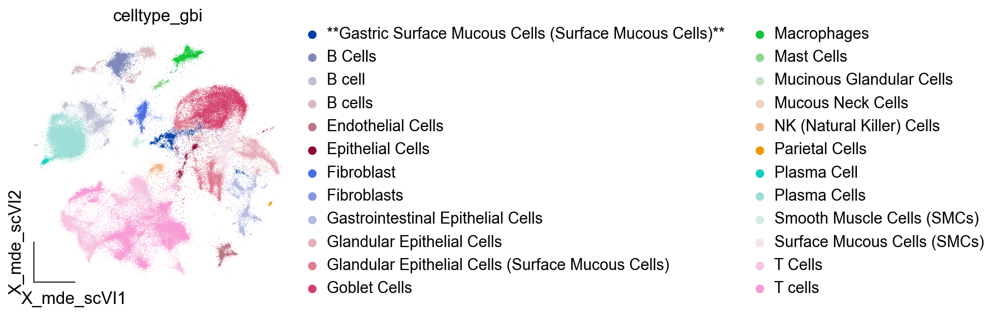

In [32]:
ov.utils.embedding(adata,
                basis='X_mde_scVI',frameon='small',
                color=['celltype_gbi'],
                #palette=ov.utils.blue_color+ov.utils.orange_color+ov.utils.red_color+ov.utils.green_color,
                show=False)

In [57]:
list(adata.obs['best_celltype'].unique())

['fibroblast',
 'gastric epithelial cell',
 't cell',
 'cytotoxic t cell',
 'b cell and antigen-presenting cell',
 'plasma cell',
 'b cell',
 'macrophage and dendritic cell',
 'enteroendocrine cell',
 'mixture of t lymphocyte and ribosomal protein expressing cell',
 't cell and mitochondrial marker',
 'epithelial cell',
 'mast cell',
 'surface mucous cell',
 'mixture of chief cells and ribosomal protein expressing cells',
 'chief cell',
 'cytotoxic t cell/natural killer cell',
 'gastric surface mucous cell',
 'ribosomal protein-producing cell',
 'smooth muscle cell',
 'endothelial cell',
 'parietal cell',
 'dendritic cell',
 'gastric chief cell']

In [35]:
# 转换为更细化的字典
cell_dict = {
    ' Fibroblast': 'Connective Tissue Cells',
    ' Mucinous Glandular Cells': 'Epithelial Cells',
    ' T Cells': 'T Lymphocytes',
    ' T cells': 'T Lymphocytes',
    ' B cells': 'B Lymphocytes',
    ' Glandular Epithelial Cells (Surface Mucous Cells)': 'Epithelial Cells',
    ' B cell': 'B Lymphocytes',
    ' B Cells': 'B Lymphocytes',
    ' Macrophages': 'Myeloid Immune Cells',
    ' Gastrointestinal Epithelial Cells': 'Epithelial Cells',
    ' Glandular Epithelial Cells': 'Epithelial Cells',
    ' Mast Cells': 'Myeloid Immune Cells',
    ' **Gastric Surface Mucous Cells (Surface Mucous Cells)**': 'Epithelial Cells',
    ' Epithelial Cells': 'Epithelial Cells',
    ' NK (Natural Killer) Cells': 'Innate Lymphocytes',
    ' Goblet Cells': 'Epithelial Cells',
    ' Plasma Cells': 'B Lymphocytes',
    ' Surface Mucous Cells (SMCs)': 'Epithelial Cells',
    ' Smooth Muscle Cells (SMCs)': 'Muscle Cells',
    ' Fibroblasts': 'Connective Tissue Cells',
    ' Endothelial Cells': 'Epithelial Cells',
    ' Parietal Cells': 'Epithelial Cells',
    ' Mucous Neck Cells': 'Epithelial Cells',
    ' Plasma Cell': 'B Lymphocytes'
}
adata.obs['Major_celltype']=adata.obs['celltype_gbi'].map(cell_dict)


<AxesSubplot: title={'center': 'Major_celltype'}, xlabel='X_mde_scVI1', ylabel='X_mde_scVI2'>

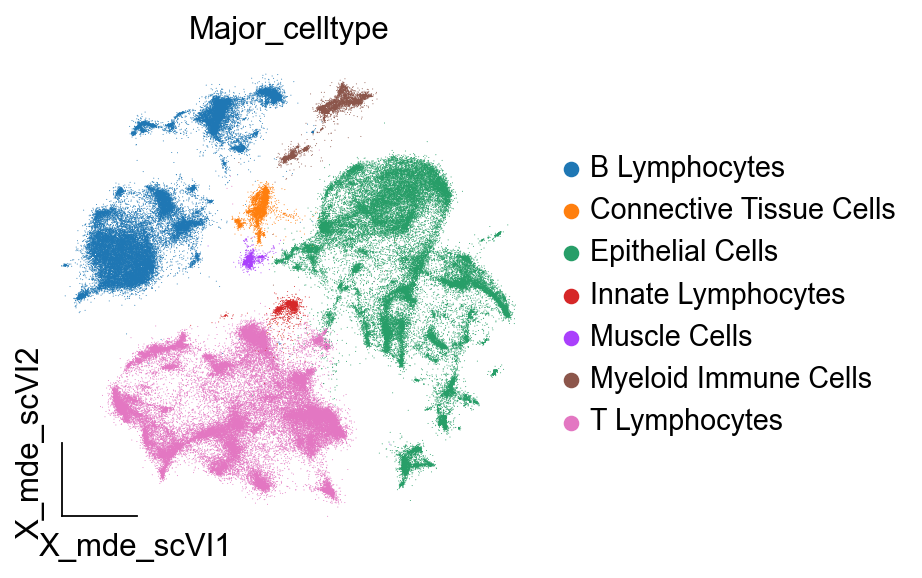

In [36]:
ov.utils.embedding(adata,
                basis='X_mde_scVI',frameon='small',
                color=['Major_celltype'],
                #palette=ov.utils.blue_color+ov.utils.orange_color+ov.utils.red_color+ov.utils.green_color,
                show=False)

In [42]:
# 转换为标准化字典
cell_dict = {
    ' Fibroblast': 'fibroblast',
    ' Mucinous Glandular Cells': 'mucinous glandular cell',
    ' T Cells': 't cell',
    ' T cells': 't cell',
    ' B cells': 'b cell',
    ' Glandular Epithelial Cells (Surface Mucous Cells)': 'glandular epithelial cell',
    ' B cell': 'b cell',
    ' B Cells': 'b cell',
    ' Macrophages': 'macrophage',
    ' Gastrointestinal Epithelial Cells': 'gastrointestinal epithelial cell',
    ' Glandular Epithelial Cells': 'glandular epithelial cell',
    ' Mast Cells': 'mast cell',
    ' **Gastric Surface Mucous Cells (Surface Mucous Cells)**': 'gastric surface mucous cell',
    ' Epithelial Cells': 'epithelial cell',
    ' NK (Natural Killer) Cells': 'nk cell',
    ' Goblet Cells': 'goblet cell',
    ' Plasma Cells': 'plasma cell',
    ' Surface Mucous Cells (SMCs)': 'surface mucous cell',
    ' Smooth Muscle Cells (SMCs)': 'smooth muscle cell',
    ' Fibroblasts': 'fibroblast',
    ' Endothelial Cells': 'endothelial cell',
    ' Parietal Cells': 'parietal cell',
    ' Mucous Neck Cells': 'mucous neck cell',
    ' Plasma Cell': 'plasma cell'
}
adata.obs['Minor_celltype']=adata.obs['celltype_gbi'].map(cell_dict)
adata.obs['Minor_celltype']=[i.capitalize() for i in adata.obs['Minor_celltype'].tolist()]

In [60]:
# 转换为标准化字典
cell_dict = {
    'fibroblast': 'fibroblast',
    'gastric epithelial cell': 'gastric epithelial cell',
    't cell': 't cell',
    'cytotoxic t cell': 'cytotoxic t cell',
    'b cell and antigen-presenting cell': 'b cell & apc',
    'plasma cell': 'plasma cell',
    'b cell': 'b cell',
    'macrophage and dendritic cell': 'macrophage & dendritic cell',
    'enteroendocrine cell': 'enteroendocrine cell',
    'mixture of t lymphocyte and ribosomal protein expressing cell': 't lymphocyte & rp cell',
    't cell and mitochondrial marker': 't cell & mito marker',
    'epithelial cell': 'epithelial cell',
    'mast cell': 'mast cell',
    'surface mucous cell': 'surface mucous cell',
    'mixture of chief cells and ribosomal protein expressing cells': 'chief cell & rp cell',
    'chief cell': 'chief cell',
    'cytotoxic t cell/natural killer cell': 'cytotoxic t cell/nk cell',
    'gastric surface mucous cell': 'gastric surface mucous cell',
    'ribosomal protein-producing cell': 'rp cell',
    'smooth muscle cell': 'smooth muscle cell',
    'endothelial cell': 'endothelial cell',
    'parietal cell': 'parietal cell',
    'dendritic cell': 'dendritic cell',
    'gastric chief cell': 'gastric chief cell'
}
adata.obs['Minor_celltype']=adata.obs['best_celltype'].map(cell_dict)
adata.obs['Minor_celltype']=[i.capitalize() for i in adata.obs['Minor_celltype'].tolist()]
adata.obs['Minor_celltype']=[i.split(' & ')[0] for i in adata.obs['Minor_celltype'].tolist()]

[<AxesSubplot: title={'center': 'Minor_celltype'}, xlabel='X_mde_scVI1', ylabel='X_mde_scVI2'>,
 <AxesSubplot: title={'center': 'CancerType'}, xlabel='X_mde_scVI1', ylabel='X_mde_scVI2'>]

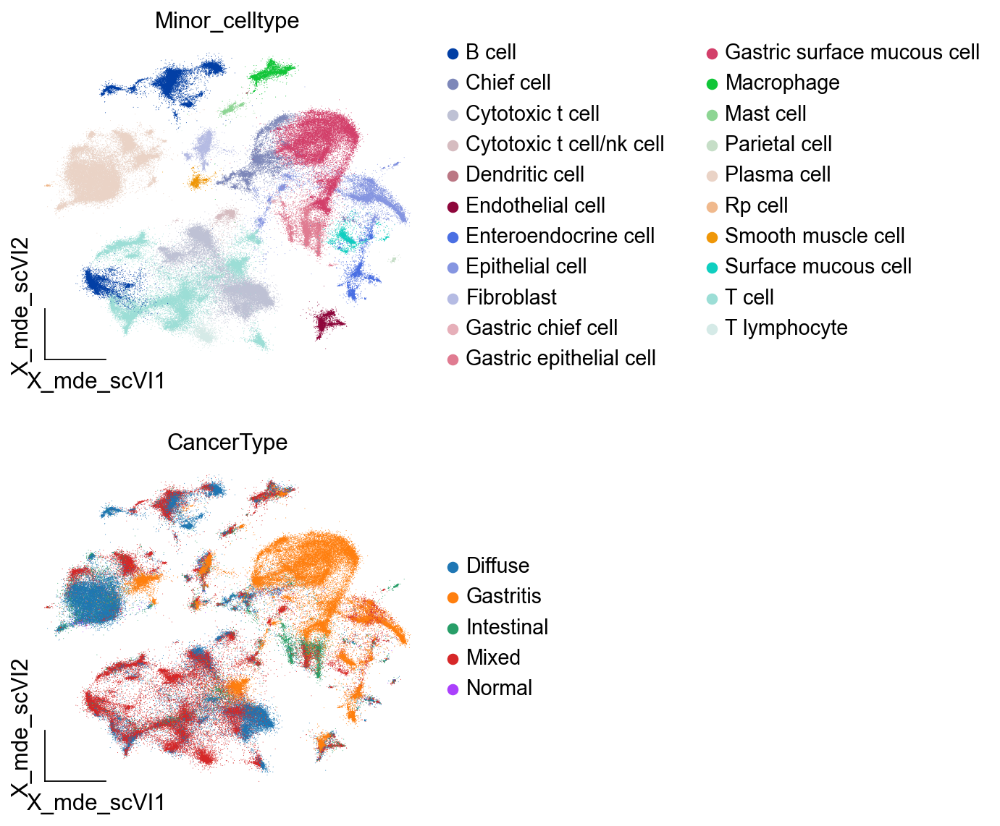

In [61]:
ov.utils.embedding(adata,
                basis='X_mde_scVI',frameon='small',
                color=['Minor_celltype','CancerType'],
                ncols=1,
                #palette=ov.utils.blue_color+ov.utils.orange_color+ov.utils.red_color+ov.utils.green_color,
                show=False)

In [62]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(
    model,
    adata=adata,
    labels_key="Minor_celltype",
    unlabeled_category="Unknown",
)

In [63]:
scanvi_model.train(max_epochs=20, n_samples_per_label=100)

INFO     Training for 20 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 20/20: 100%|██████████| 20/20 [08:10<00:00, 27.23s/it, v_num=1, train_loss_step=1.52e+3, train_loss_epoch=1.43e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [08:10<00:00, 24.54s/it, v_num=1, train_loss_step=1.52e+3, train_loss_epoch=1.43e+3]


In [64]:
SCANVI_LATENT_KEY = "X_scANVI"
adata.obsm[SCANVI_LATENT_KEY] = scanvi_model.get_latent_representation(adata)

In [65]:
ov.pp.mde(adata,embedding_dim=2,
          n_neighbors=15, basis='X_mde_scANVI',
          n_pcs=50, use_rep='X_scANVI',)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsm['X_mde_scANVI']`, MDE coordinates
    `.obsp['neighbors_distances']`, distances for each pair of neighbors
    `.obsp['neighbors_connectivities']`, weighted adjacency matrix (0:00:22)


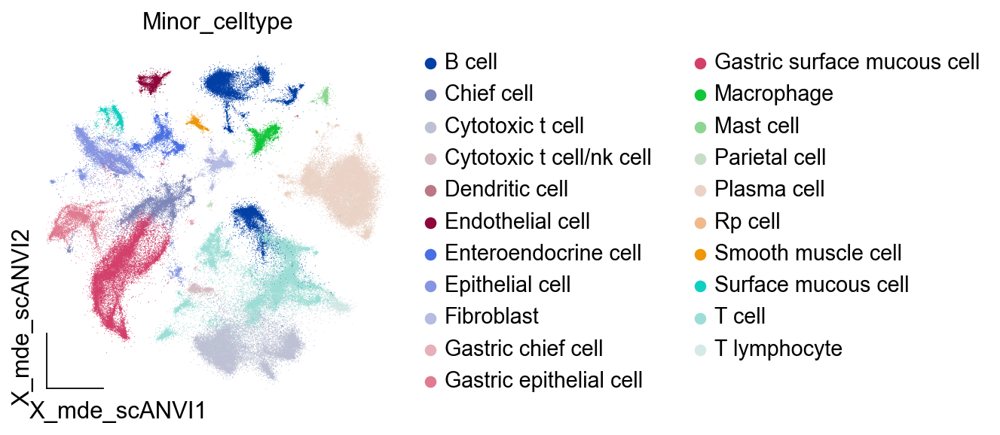

In [66]:
ov.pl.embedding(adata,
                basis='X_mde_scANVI',
                color='Minor_celltype',
                frameon='small')

In [67]:
adata.obs['C_scANVI'] = scanvi_model.predict(adata)

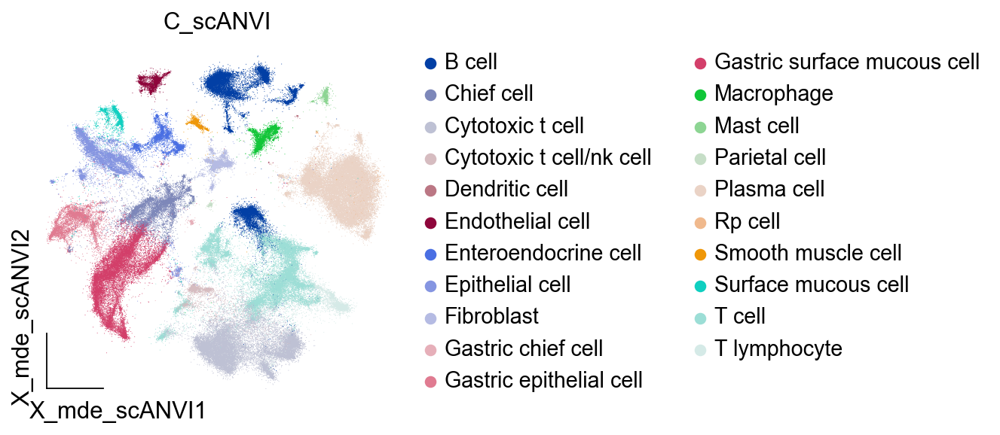

In [68]:
ov.pl.embedding(adata,
                basis='X_mde_scANVI',
                color='C_scANVI',
                frameon='small')

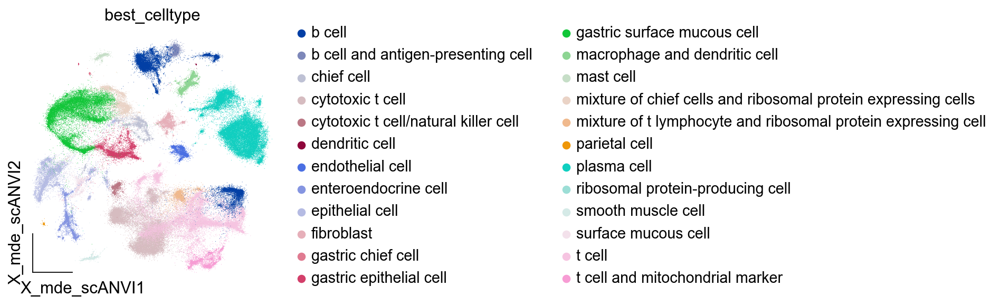

In [56]:
ov.pl.embedding(adata,
                basis='X_mde_scANVI',
                color='best_celltype',
                frameon='small')

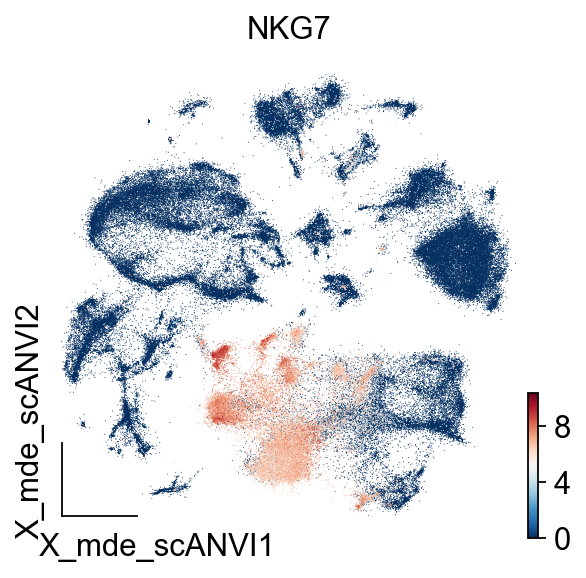

In [55]:
ov.pl.embedding(adata,
                basis='X_mde_scANVI',
                color='NKG7',
                frameon='small')

In [ ]:
adata.write('data/GC_All_SCANVI.h5ad',compression='gzip')